In [1]:
import Pkg
Pkg.activate(@__DIR__)

  Activating project at `~/Developer/analyze-iris`


In [2]:
using CSV
using Dates
using Plots
using DataFrames

In [3]:
data = CSV.read(joinpath("data", "p175.csv"), DataFrame)
select!(data, Not(:Job))
dropmissing!(data)

Row,User,Project,Host Name,Partition,QOS,Submit,Start,End,Wait Time,Elapsed Secs,CPUs,Nodes Allocated,Hours Charged,Raw Hours,Machine Hours
,String31,String7,String15,String15,String15,String31,String31,String31,Int64,Int64,Int64,Int64,Float64,Float64,Float64
1,"Pseudo User, cctbx",lcls,cori haswell,resv,resv,2020-09-18 12:24:32,2020-09-18 12:24:42,2020-09-18 12:50:55,10,1573,2048,32,1957.51,13.9822,1957.51
2,"Pseudo User, cctbx",lcls,cori haswell,resv,resv,2020-09-18 12:24:36,2020-09-18 12:51:29,2020-09-18 12:52:58,1613,89,2048,32,110.756,0.791111,110.756
3,"Pseudo User, cctbx",lcls,cori haswell,realtime_shared,realtime_lcls,2020-09-18 13:16:56,2020-09-18 13:17:05,2020-09-18 13:19:04,9,119,640,20,92.5556,0.661111,92.5556
4,"Pseudo User, cctbx",lcls,cori haswell,realtime_shared,realtime_lcls,2020-09-18 13:17:08,2020-09-18 13:19:15,2020-09-18 13:21:32,127,137,640,20,106.556,0.761111,106.556
5,"Pseudo User, cctbx",lcls,cori haswell,realtime_shared,realtime_lcls,2020-09-18 14:16:18,2020-09-18 14:16:31,2020-09-18 14:17:25,13,54,640,20,42.0,0.3,42.0
6,"Pseudo User, cctbx",lcls,cori haswell,realtime_shared,realtime_lcls,2020-09-18 14:21:08,2020-09-18 14:21:25,2020-09-18 14:22:15,17,50,640,20,38.8889,0.277778,38.8889
7,"Pseudo User, cctbx",lcls,cori haswell,regular_hsw,premium,2020-09-18 14:23:27,2020-09-18 14:32:53,2020-09-18 14:34:13,566,80,1280,20,124.444,0.444444,62.2222
8,"Pseudo User, cctbx",lcls,cori haswell,regular_hsw,premium,2020-09-18 14:37:45,2020-09-18 14:44:04,2020-09-18 14:45:22,379,78,1280,20,121.333,0.433333,60.6667
9,"Pseudo User, cctbx",lcls,cori haswell,regular_hsw,premium,2020-09-18 14:55:14,2020-09-18 15:03:41,2020-09-18 15:06:35,507,174,1280,20,270.667,0.966667,135.333


In [4]:
milliseconds(x::AbstractString) = DateTime(x, "yyyy-mm-dd HH:MM:SS").instant.periods.value
milliseconds(data::Array{T}) where T<:AbstractString = map((x)->milliseconds(x), data)

milliseconds (generic function with 2 methods)

In [5]:
start_s = Int64(minimum(milliseconds(data.Start))//1000)
end_s   = Int64(maximum(milliseconds(data.End))//1000)

compute = zeros(Int64, end_s - start_s)
for row in eachrow(data)
    start_job = Int64(milliseconds(row.Start)//1000) - start_s + 1
    end_job   = Int64(milliseconds(row.End)//1000) - start_s

    n_cpus    = Int64(row.CPUs)
    for sec = start_job:end_job
        compute[sec] += n_cpus
    end
end

In [6]:
moving_average(vs,n) = [
    sum(@view vs[i:(i+n-1)])/n for i in 1:(length(vs)-(n-1))
]

moving_average (generic function with 1 method)

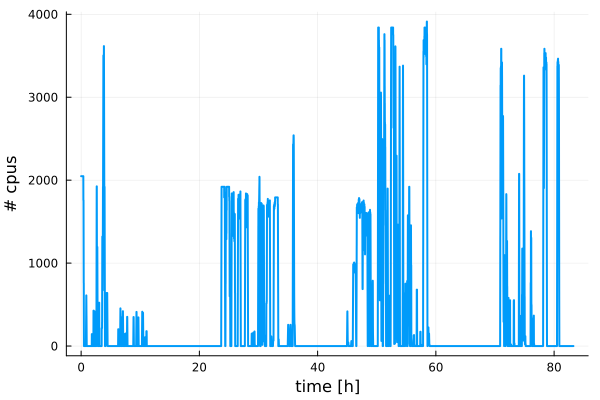

In [7]:
plot_start = 1
plot_end   = 300000
n_average  = 240

x = [plot_start:plot_end-n_average+1]/60^2
p = plot(x, moving_average(compute[plot_start:plot_end], n_average), legend=false, linewidth=2)
xlabel!("time [h]")
ylabel!("# cpus")
# savefig(joinpath("figures", "p175_all.pdf"))

p

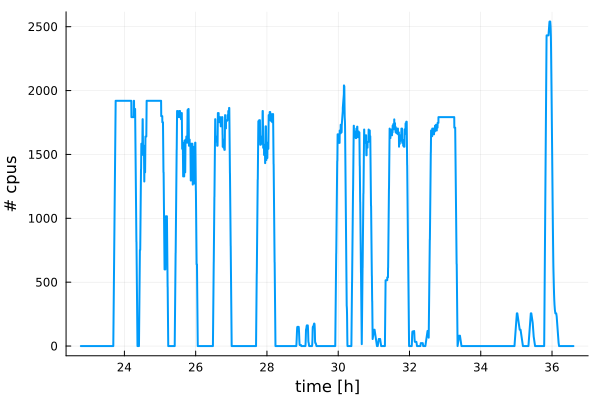

In [8]:
plot_start = 82000
plot_end   = 132000
n_average  = 240

x = [plot_start:plot_end-n_average+1]/60^2
p = plot(x, moving_average(compute[plot_start:plot_end], n_average), legend=false, linewidth=2)
xlabel!("time [h]")
ylabel!("# cpus")
# savefig(joinpath("figures", "p175_day2.pdf"))

p

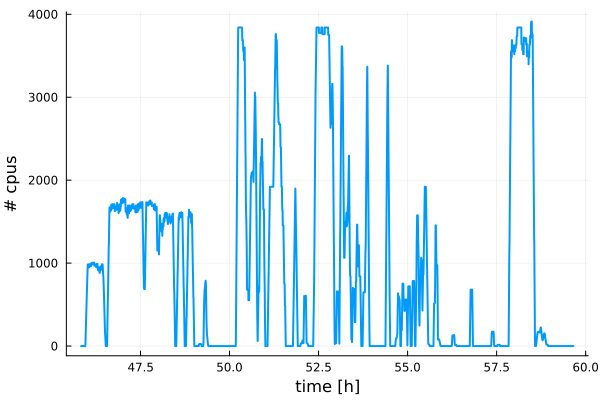

In [9]:
plot_start = 165000
plot_end   = 215000
n_average  = 240

x = [plot_start:plot_end-n_average+1]/60^2
p = plot(x, moving_average(compute[plot_start:plot_end], n_average), legend=false, linewidth=2)
xlabel!("time [h]")
ylabel!("# cpus")
# savefig(joinpath("figures", "p175_day3.pdf"))

p

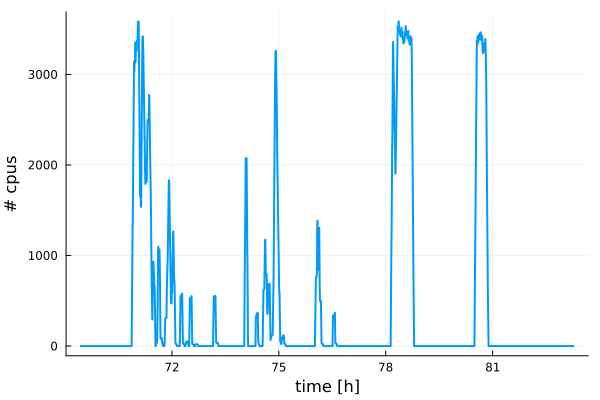

In [10]:
plot_start = 250000
plot_end   = 300000
n_average  = 240

x = [plot_start:plot_end-n_average+1]/60^2
p = plot(x, moving_average(compute[plot_start:plot_end], n_average), legend=false, linewidth=2)
xlabel!("time [h]")
ylabel!("# cpus")
# savefig(joinpath("figures", "p175_day4.pdf"))

p

In [11]:
sum(compute)/60/60

31166.933333333334

In [12]:
data_lv95_blaschke = CSV.read(joinpath("data", "lv95-blaschke.csv"), DataFrame)
select!(data_lv95_blaschke, Not(:Job))
dropmissing!(data_lv95_blaschke)

Row,User,Project,Host Name,Partition,QOS,Submit,Start,End,Wait Time,Elapsed Secs,CPUs,Nodes Allocated,Hours Charged,Raw Hours,Machine Hours
,String31,String7,String15,String7,String7,String31,String31,String31,Int64,Int64,Int64,Int64,Float64,Float64,Float64
1,"Blaschke, Johannes",lcls,cori haswell,resv,resv,2020-09-11 14:12:40,2020-09-11 14:12:49,2020-09-11 14:16:33,9,224,2048,32,278.756,1.99111,278.756
2,"Blaschke, Johannes",lcls,cori haswell,resv,resv,2020-09-11 14:15:21,2020-09-11 14:16:37,2020-09-11 14:20:28,76,231,2048,32,287.467,2.05333,287.467
3,"Blaschke, Johannes",lcls,cori haswell,resv,resv,2020-09-11 14:36:40,2020-09-11 14:36:48,2020-09-11 14:40:24,8,216,2048,32,268.8,1.92,268.8
4,"Blaschke, Johannes",lcls,cori haswell,resv,resv,2020-09-11 14:40:26,2020-09-11 14:41:04,2020-09-11 14:42:10,38,66,2048,32,82.1333,0.586667,82.1333
5,"Blaschke, Johannes",lcls,cori haswell,resv,resv,2020-09-11 15:08:33,2020-09-11 15:08:42,2020-09-11 15:12:07,9,205,2048,32,255.111,1.82222,255.111
6,"Blaschke, Johannes",lcls,cori haswell,resv,resv,2020-09-11 16:56:03,2020-09-11 16:56:15,2020-09-11 16:56:41,12,26,2048,32,32.3556,0.231111,32.3556
7,"Blaschke, Johannes",lcls,cori haswell,resv,resv,2020-09-11 17:05:35,2020-09-11 17:05:46,2020-09-11 17:06:16,11,30,2048,32,37.3333,0.266667,37.3333
8,"Blaschke, Johannes",lcls,cori haswell,resv,resv,2020-09-11 17:12:00,2020-09-11 17:12:07,2020-09-11 17:13:45,7,98,2048,32,121.956,0.871111,121.956
9,"Blaschke, Johannes",lcls,cori haswell,resv,resv,2020-09-11 17:18:38,2020-09-11 17:18:51,2020-09-11 17:22:19,13,208,2048,32,258.844,1.84889,258.844


In [13]:
data_lv95_dwpaley = CSV.read(joinpath("data", "lv95-dwpaley.csv"), DataFrame)
select!(data_lv95_dwpaley, Not(:Job))
dropmissing!(data_lv95_dwpaley)

Row,User,Project,Host Name,Partition,QOS,Submit,Start,End,Wait Time,Elapsed Secs,CPUs,Nodes Allocated,Hours Charged,Raw Hours,Machine Hours
,String15,String7,String15,String7,String7,String31,String31,String31,Int64,Int64,Int64,Int64,Float64,Float64,Float64
1,"Paley, Daniel",lcls,cori haswell,resv,resv,2020-09-11 14:23:55,2020-09-11 14:24:03,2020-09-11 14:24:28,8,25,2048,32,31.1111,0.222222,31.1111
2,"Paley, Daniel",lcls,cori haswell,resv,resv,2020-09-11 14:43:38,2020-09-11 14:43:51,2020-09-11 14:44:39,13,48,2048,32,59.7333,0.426667,59.7333
3,"Paley, Daniel",lcls,cori haswell,resv,resv,2020-09-11 14:55:02,2020-09-11 14:55:12,2020-09-11 14:55:47,10,35,2048,32,43.5556,0.311111,43.5556
4,"Paley, Daniel",lcls,cori haswell,resv,resv,2020-09-11 14:56:54,2020-09-11 14:57:06,2020-09-11 14:57:45,12,39,2048,32,48.5333,0.346667,48.5333
5,"Paley, Daniel",lcls,cori haswell,resv,resv,2020-09-11 15:00:57,2020-09-11 15:01:10,2020-09-11 15:01:37,13,27,2048,32,33.6,0.24,33.6
6,"Paley, Daniel",lcls,cori haswell,resv,resv,2020-09-11 15:22:37,2020-09-11 15:22:47,2020-09-11 15:26:28,10,221,2048,32,275.022,1.96444,275.022
7,"Paley, Daniel",lcls,cori haswell,resv,resv,2020-09-11 16:53:34,2020-09-11 16:53:42,2020-09-11 16:54:11,8,29,2048,32,36.0889,0.257778,36.0889
8,"Paley, Daniel",lcls,cori haswell,resv,resv,2020-09-13 22:14:22,2020-09-13 22:14:22,2020-09-13 22:28:10,0,828,64,1,32.2,0.23,32.2
9,"Paley, Daniel",lcls,cori haswell,resv,resv,2020-09-13 22:30:47,2020-09-13 22:30:47,2020-09-13 22:37:00,0,373,64,1,14.5056,0.103611,14.5056


In [14]:
start_s = Int64(minimum(milliseconds(data_lv95_blaschke.Start))//1000)
end_s   = Int64(maximum(milliseconds(data_lv95_blaschke.End))//1000)

compute_lv95_blaschke = zeros(Int64, end_s - start_s)
for row in eachrow(data_lv95_blaschke)
    start_job = Int64(milliseconds(row.Start)//1000) - start_s + 1
    end_job   = Int64(milliseconds(row.End)//1000) - start_s

    n_cpus    = Int64(row.CPUs)
    for sec = start_job:end_job
        compute_lv95_blaschke[sec] += n_cpus
    end
end

In [15]:
start_s = Int64(minimum(milliseconds(data_lv95_dwpaley.Start))//1000)
end_s   = Int64(maximum(milliseconds(data_lv95_dwpaley.End))//1000)

compute_lv95_dwpaley = zeros(Int64, end_s - start_s)
for row in eachrow(data_lv95_dwpaley)
    start_job = Int64(milliseconds(row.Start)//1000) - start_s + 1
    end_job   = Int64(milliseconds(row.End)//1000) - start_s

    n_cpus    = Int64(row.CPUs)
    for sec = start_job:end_job
        compute_lv95_dwpaley[sec] += n_cpus
    end
end

In [16]:
(sum(compute_lv95_blaschke)+sum(compute_lv95_dwpaley))/60/60

22662.719999999998